In [1]:
!pip install torchsummary
!pip install gdown

  Installing build dependencies ... - \ | / - done
  Getting requirements to build wheel ... - done
    Preparing wheel metadata ... - done
  Created wheel for gdown: filename=gdown-4.0.2-py3-none-any.whl size=10598 sha256=597da7a675da82963e9c1899430d126146e75fc1c878cec717939a4fa09048ab
  Stored in directory: /root/.cache/pip/wheels/75/20/08/4d138cf98df8fe9e14e369c7de79e01c5cabca55b0f58cef3a
Successfully built gdown


In [2]:
import torch
import numpy as np
from PIL import Image
from IPython.display import display
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from torchvision.utils import save_image
from torchvision.utils import make_grid
from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt
import datetime
import os

In [3]:
torch.manual_seed(17)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
batch_size = 64

In [4]:
directory = 'tin'
n_classes = 3

train_transform = transforms.Compose([
    transforms.Resize((128, 128), interpolation=2),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])])
train_dataset = datasets.ImageFolder(root=directory, transform=train_transform)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)

/opt/conda/lib/python3.7/site-packages/torchvision/transforms/transforms.py:281: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


In [5]:
def show_images(images):
    fig, ax = plt.subplots(figsize=(64, 64))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images.detach(), nrow=8).permute(1, 2, 0))

def show_batch(dl):
    for images, _ in dl:
        show_images(images)
        break

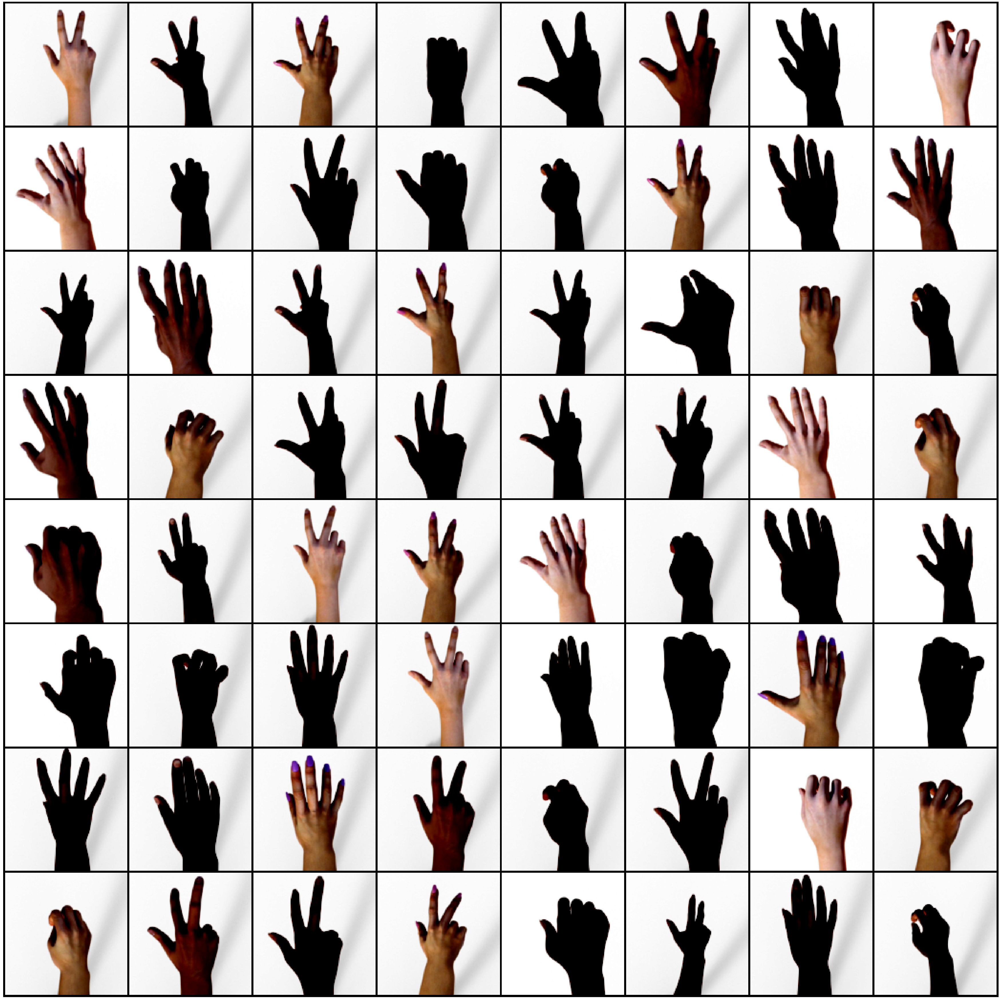

In [6]:
show_batch(train_loader)

In [7]:
image_shape = (3, 128, 128)
image_dim = int(np.prod(image_shape))
latent_dim = 100
embedding_dim = 100

In [8]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight, 1.0, 0.02)
        torch.nn.init.zeros_(m.bias)

In [9]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.label_conditioned_generator = nn.Sequential(nn.Embedding(n_classes, embedding_dim),
                      nn.Linear(embedding_dim, 16))
        self.latent = nn.Sequential(nn.Linear(latent_dim, 4*4*512),
                                   nn.LeakyReLU(0.2, inplace=True))
        self.model = nn.Sequential(nn.ConvTranspose2d(513, 64*8, 4, 2, 1, bias=False),
                      nn.BatchNorm2d(64*8, momentum=0.1,  eps=0.8),
                      nn.ReLU(True),
                      nn.ConvTranspose2d(64*8, 64*4, 4, 2, 1,bias=False),
                      nn.BatchNorm2d(64*4, momentum=0.1,  eps=0.8),
                      nn.ReLU(True), 
                      nn.ConvTranspose2d(64*4, 64*2, 4, 2, 1,bias=False),
                      nn.BatchNorm2d(64*2, momentum=0.1,  eps=0.8),
                      nn.ReLU(True), 
                      nn.ConvTranspose2d(64*2, 64*1, 4, 2, 1,bias=False),
                      nn.BatchNorm2d(64*1, momentum=0.1,  eps=0.8),
                      nn.ReLU(True), 
                      nn.ConvTranspose2d(64*1, 3, 4, 2, 1, bias=False),
                      nn.Tanh())

    def forward(self, inputs):
        noise_vector, label = inputs
        label_output = self.label_conditioned_generator(label)
        label_output = label_output.view(-1, 1, 4, 4)
        latent_output = self.latent(noise_vector)
        latent_output = latent_output.view(-1, 512,4,4)
        concat = torch.cat((latent_output, label_output), dim=1)
        image = self.model(concat)
        #print(image.size())
        return image

In [10]:
generator = Generator().to(device)
generator.apply(weights_init)
print(generator)

Generator(
  (label_conditioned_generator): Sequential(
    (0): Embedding(3, 100)
    (1): Linear(in_features=100, out_features=16, bias=True)
  )
  (latent): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (model): Sequential(
    (0): ConvTranspose2d(513, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_si

In [11]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.label_condition_disc = nn.Sequential(nn.Embedding(n_classes, embedding_dim),
                      nn.Linear(embedding_dim, 3*128*128))
             
        self.model = nn.Sequential(nn.Conv2d(6, 64, 4, 2, 1, bias=False),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Conv2d(64, 64*2, 4, 3, 2, bias=False),
                      nn.BatchNorm2d(64*2, momentum=0.1,  eps=0.8),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Conv2d(64*2, 64*4, 4, 3,2, bias=False),
                      nn.BatchNorm2d(64*4, momentum=0.1,  eps=0.8),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Conv2d(64*4, 64*8, 4, 3, 2, bias=False),
                      nn.BatchNorm2d(64*8, momentum=0.1,  eps=0.8),
                      nn.LeakyReLU(0.2, inplace=True), 
                      nn.Flatten(),
                      nn.Dropout(0.4),
                      nn.Linear(4608, 1),
                      nn.Sigmoid())

    def forward(self, inputs):
        img, label = inputs
        label_output = self.label_condition_disc(label)
        label_output = label_output.view(-1, 3, 128, 128)
        concat = torch.cat((img, label_output), dim=1)
        #print(concat.size())
        output = self.model(concat)
        return output

In [12]:
discriminator = Discriminator().to(device)
discriminator.apply(weights_init)
print(discriminator)

Discriminator(
  (label_condition_disc): Sequential(
    (0): Embedding(3, 100)
    (1): Linear(in_features=100, out_features=49152, bias=True)
  )
  (model): Sequential(
    (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(3, 3), padding=(2, 2), bias=False)
    (3): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(3, 3), padding=(2, 2), bias=False)
    (6): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(3, 3), padding=(2, 2), bias=False)
    (9): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)


In [13]:
adversarial_loss = nn.BCELoss()

def generator_loss(fake_output, label):
    gen_loss = adversarial_loss(fake_output, label)
    return gen_loss

def discriminator_loss(output, label):
    disc_loss = adversarial_loss(output, label)
    return disc_loss

In [14]:
learning_rate = 0.0002 
G_optimizer = optim.Adam(generator.parameters(), lr = learning_rate, betas=(0.5, 0.999))
D_optimizer = optim.Adam(discriminator.parameters(), lr = learning_rate, betas=(0.5, 0.999))

Epoch: [1/200]: D_loss: 0.308, G_loss: 1.869
Epoch: [2/200]: D_loss: 0.332, G_loss: 1.969
Epoch: [3/200]: D_loss: 0.402, G_loss: 2.113
Epoch: [4/200]: D_loss: 0.382, G_loss: 1.710
Epoch: [5/200]: D_loss: 0.459, G_loss: 1.838
Epoch: [6/200]: D_loss: 0.502, G_loss: 1.807
Epoch: [7/200]: D_loss: 0.488, G_loss: 1.649
Epoch: [8/200]: D_loss: 0.456, G_loss: 1.652
Epoch: [9/200]: D_loss: 0.455, G_loss: 1.718
Epoch: [10/200]: D_loss: 0.451, G_loss: 1.802
Saving sample output Sample_epoch_10.png


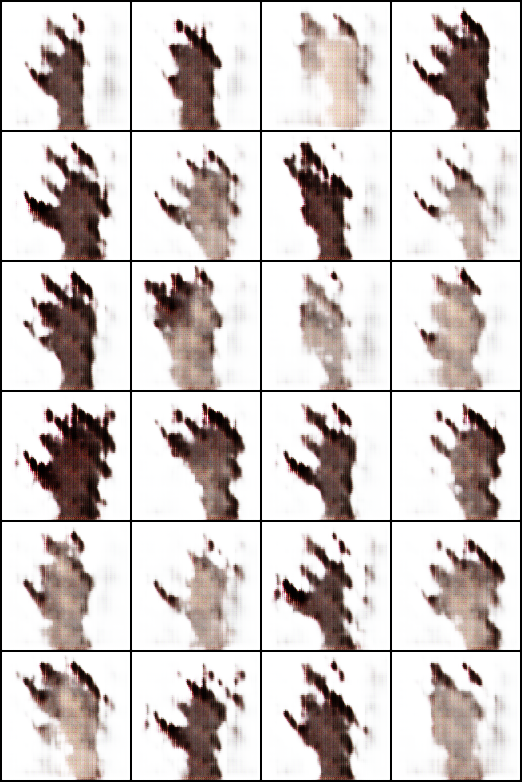

Saving model training check point
Epoch: [11/200]: D_loss: 0.372, G_loss: 2.030
Epoch: [12/200]: D_loss: 0.398, G_loss: 2.135
Epoch: [13/200]: D_loss: 0.373, G_loss: 2.215
Epoch: [14/200]: D_loss: 0.475, G_loss: 2.081
Epoch: [15/200]: D_loss: 0.420, G_loss: 1.836
Epoch: [16/200]: D_loss: 0.424, G_loss: 1.709
Epoch: [17/200]: D_loss: 0.453, G_loss: 1.606
Epoch: [18/200]: D_loss: 0.443, G_loss: 1.601
Epoch: [19/200]: D_loss: 0.444, G_loss: 1.618
Epoch: [20/200]: D_loss: 0.454, G_loss: 1.634
Saving sample output Sample_epoch_20.png


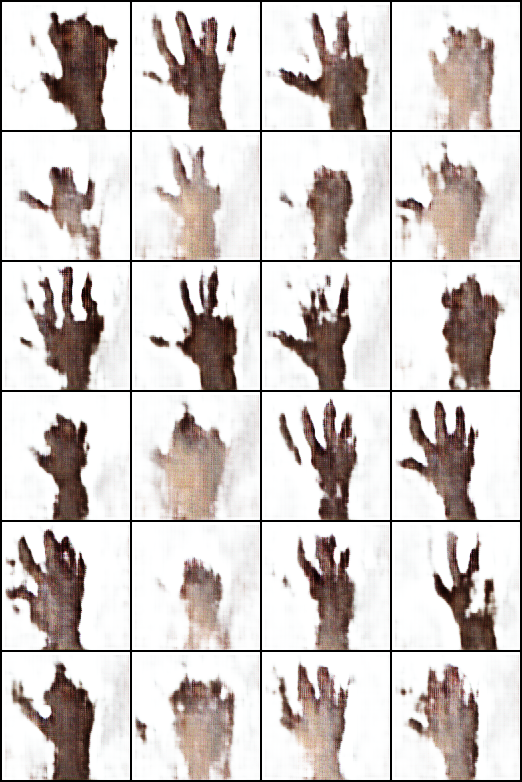

Saving model training check point
Epoch: [21/200]: D_loss: 0.421, G_loss: 1.678
Epoch: [22/200]: D_loss: 0.422, G_loss: 1.764
Epoch: [23/200]: D_loss: 0.407, G_loss: 1.764
Epoch: [24/200]: D_loss: 0.414, G_loss: 1.790
Epoch: [25/200]: D_loss: 0.408, G_loss: 1.845
Epoch: [26/200]: D_loss: 0.417, G_loss: 1.947
Epoch: [27/200]: D_loss: 0.381, G_loss: 1.962
Epoch: [28/200]: D_loss: 0.368, G_loss: 1.943
Epoch: [29/200]: D_loss: 0.387, G_loss: 2.015
Epoch: [30/200]: D_loss: 0.400, G_loss: 2.107
Saving sample output Sample_epoch_30.png


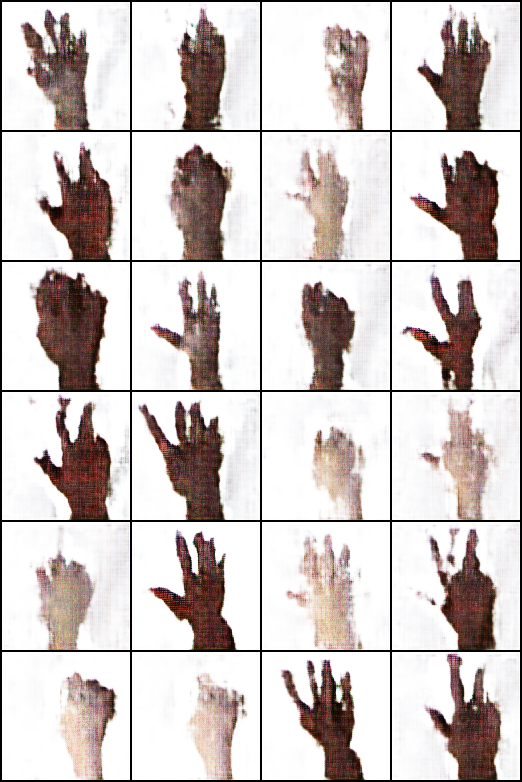

Saving model training check point
Epoch: [31/200]: D_loss: 0.340, G_loss: 2.026
Epoch: [32/200]: D_loss: 0.418, G_loss: 2.274
Epoch: [33/200]: D_loss: 0.352, G_loss: 2.110
Epoch: [34/200]: D_loss: 0.367, G_loss: 2.264
Epoch: [35/200]: D_loss: 0.353, G_loss: 2.265
Epoch: [36/200]: D_loss: 0.328, G_loss: 2.240
Epoch: [37/200]: D_loss: 0.324, G_loss: 2.308
Epoch: [38/200]: D_loss: 0.320, G_loss: 2.334
Epoch: [39/200]: D_loss: 0.305, G_loss: 2.385
Epoch: [40/200]: D_loss: 0.298, G_loss: 2.466
Saving sample output Sample_epoch_40.png


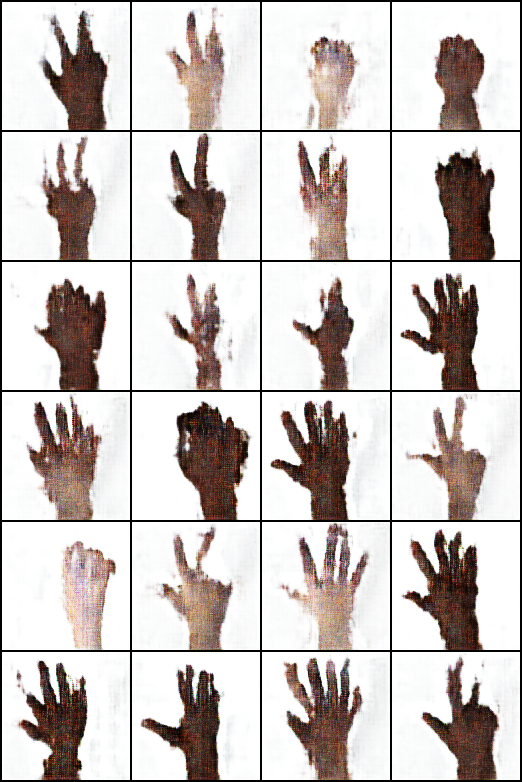

Saving model training check point
Epoch: [41/200]: D_loss: 0.436, G_loss: 2.616
Epoch: [42/200]: D_loss: 0.263, G_loss: 2.473
Epoch: [43/200]: D_loss: 0.303, G_loss: 2.529
Epoch: [44/200]: D_loss: 0.281, G_loss: 2.601
Epoch: [45/200]: D_loss: 0.289, G_loss: 2.571
Epoch: [46/200]: D_loss: 0.256, G_loss: 2.671
Epoch: [47/200]: D_loss: 0.350, G_loss: 2.736
Epoch: [48/200]: D_loss: 0.250, G_loss: 2.759
Epoch: [49/200]: D_loss: 0.357, G_loss: 2.778
Epoch: [50/200]: D_loss: 0.333, G_loss: 2.741
Saving sample output Sample_epoch_50.png


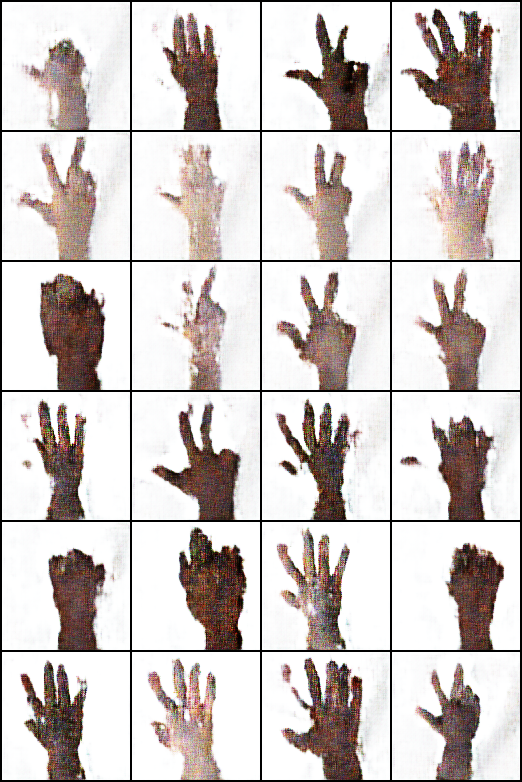

Saving model training check point
Epoch: [51/200]: D_loss: 0.241, G_loss: 2.713
Epoch: [52/200]: D_loss: 0.266, G_loss: 2.860
Epoch: [53/200]: D_loss: 0.267, G_loss: 2.877
Epoch: [54/200]: D_loss: 0.244, G_loss: 2.926
Epoch: [55/200]: D_loss: 0.263, G_loss: 2.863
Epoch: [56/200]: D_loss: 0.235, G_loss: 2.947
Epoch: [57/200]: D_loss: 0.328, G_loss: 3.024
Epoch: [58/200]: D_loss: 0.228, G_loss: 2.989
Epoch: [59/200]: D_loss: 0.231, G_loss: 3.048
Epoch: [60/200]: D_loss: 0.203, G_loss: 3.092
Saving sample output Sample_epoch_60.png


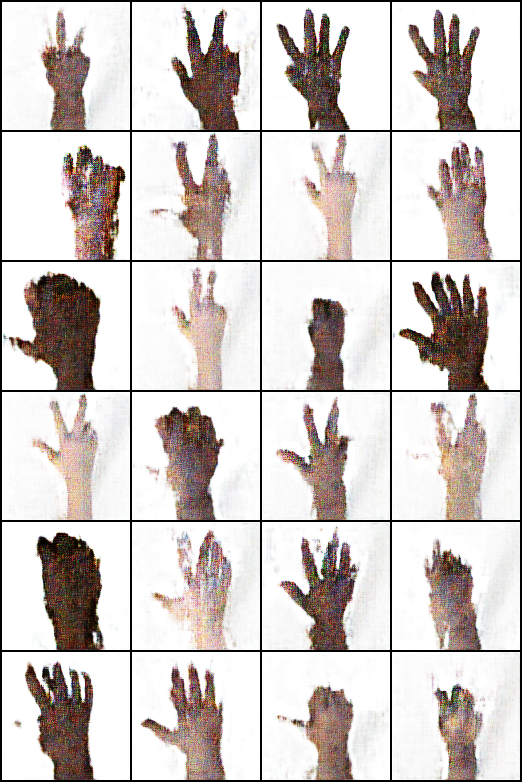

Saving model training check point
Epoch: [61/200]: D_loss: 0.247, G_loss: 3.059
Epoch: [62/200]: D_loss: 0.262, G_loss: 3.119
Epoch: [63/200]: D_loss: 0.229, G_loss: 3.144
Epoch: [64/200]: D_loss: 0.238, G_loss: 3.184
Epoch: [65/200]: D_loss: 0.377, G_loss: 3.424
Epoch: [66/200]: D_loss: 0.326, G_loss: 3.009
Epoch: [67/200]: D_loss: 0.223, G_loss: 3.089
Epoch: [68/200]: D_loss: 0.192, G_loss: 3.221
Epoch: [69/200]: D_loss: 0.208, G_loss: 3.285
Epoch: [70/200]: D_loss: 0.205, G_loss: 3.331
Saving sample output Sample_epoch_70.png


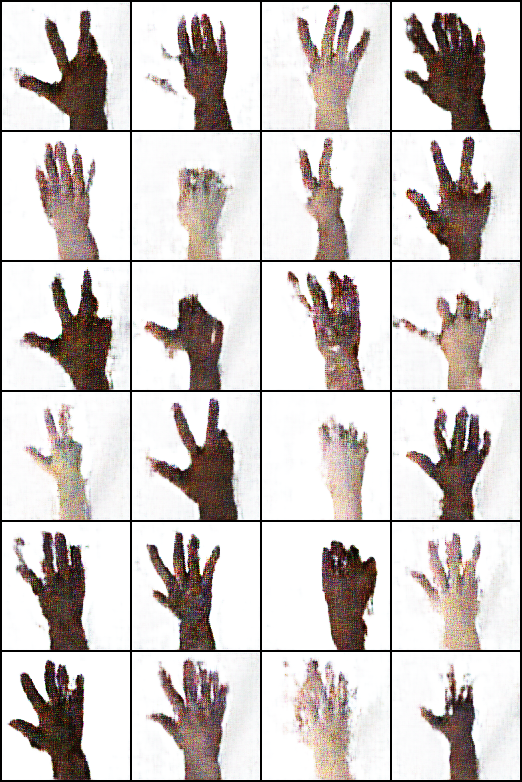

Saving model training check point
Epoch: [71/200]: D_loss: 0.202, G_loss: 3.336
Epoch: [72/200]: D_loss: 0.194, G_loss: 3.436
Epoch: [73/200]: D_loss: 0.211, G_loss: 3.481
Epoch: [74/200]: D_loss: 0.203, G_loss: 3.453
Epoch: [75/200]: D_loss: 0.187, G_loss: 3.591
Epoch: [76/200]: D_loss: 0.768, G_loss: 3.165
Epoch: [77/200]: D_loss: 0.217, G_loss: 3.134
Epoch: [78/200]: D_loss: 0.189, G_loss: 3.268
Epoch: [79/200]: D_loss: 0.182, G_loss: 3.370
Epoch: [80/200]: D_loss: 0.181, G_loss: 3.416
Saving sample output Sample_epoch_80.png


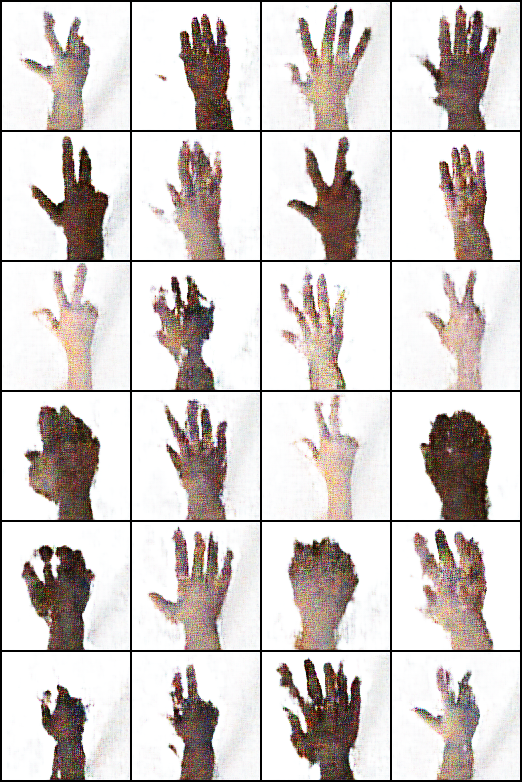

Saving model training check point
Epoch: [81/200]: D_loss: 0.157, G_loss: 3.583
Epoch: [82/200]: D_loss: 0.180, G_loss: 3.569
Epoch: [83/200]: D_loss: 0.196, G_loss: 3.549
Epoch: [84/200]: D_loss: 0.182, G_loss: 3.637
Epoch: [85/200]: D_loss: 0.344, G_loss: 3.664
Epoch: [86/200]: D_loss: 0.164, G_loss: 3.566
Epoch: [87/200]: D_loss: 0.172, G_loss: 3.703
Epoch: [88/200]: D_loss: 0.190, G_loss: 3.703
Epoch: [89/200]: D_loss: 0.150, G_loss: 3.826
Epoch: [90/200]: D_loss: 0.232, G_loss: 3.721
Saving sample output Sample_epoch_90.png


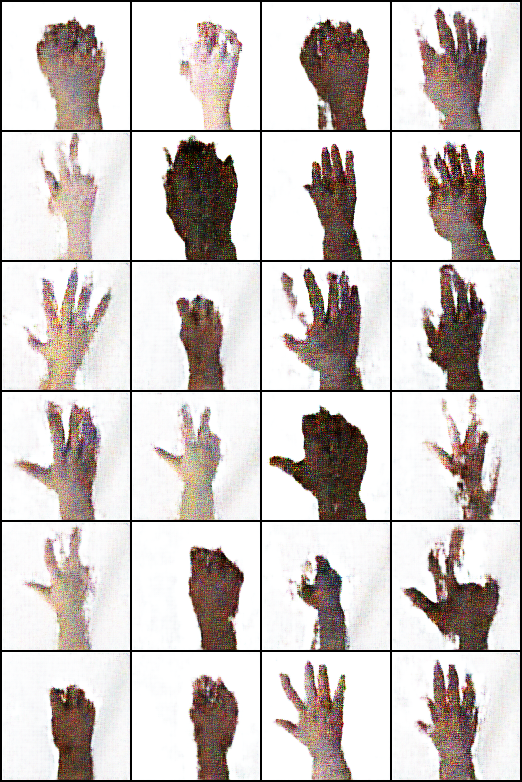

Saving model training check point
Epoch: [91/200]: D_loss: 0.283, G_loss: 3.730
Epoch: [92/200]: D_loss: 0.170, G_loss: 3.792
Epoch: [93/200]: D_loss: 0.156, G_loss: 3.798
Epoch: [94/200]: D_loss: 0.217, G_loss: 3.924
Epoch: [95/200]: D_loss: 0.190, G_loss: 3.775
Epoch: [96/200]: D_loss: 0.169, G_loss: 3.844
Epoch: [97/200]: D_loss: 0.181, G_loss: 4.048
Epoch: [98/200]: D_loss: 0.333, G_loss: 3.711
Epoch: [99/200]: D_loss: 0.153, G_loss: 3.906
Epoch: [100/200]: D_loss: 0.148, G_loss: 3.857
Saving sample output Sample_epoch_100.png


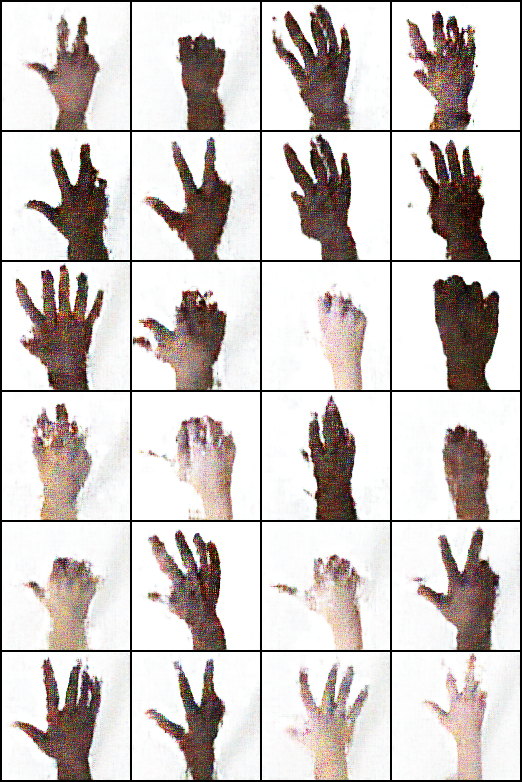

Saving model training check point
Epoch: [101/200]: D_loss: 0.135, G_loss: 4.024
Epoch: [102/200]: D_loss: 0.168, G_loss: 4.118
Epoch: [103/200]: D_loss: 0.185, G_loss: 3.977
Epoch: [104/200]: D_loss: 0.145, G_loss: 4.085
Epoch: [105/200]: D_loss: 0.200, G_loss: 4.153
Epoch: [106/200]: D_loss: 0.187, G_loss: 4.050
Epoch: [107/200]: D_loss: 0.599, G_loss: 3.381
Epoch: [108/200]: D_loss: 0.163, G_loss: 3.688
Epoch: [109/200]: D_loss: 0.146, G_loss: 3.931
Epoch: [110/200]: D_loss: 0.152, G_loss: 3.972
Saving sample output Sample_epoch_110.png


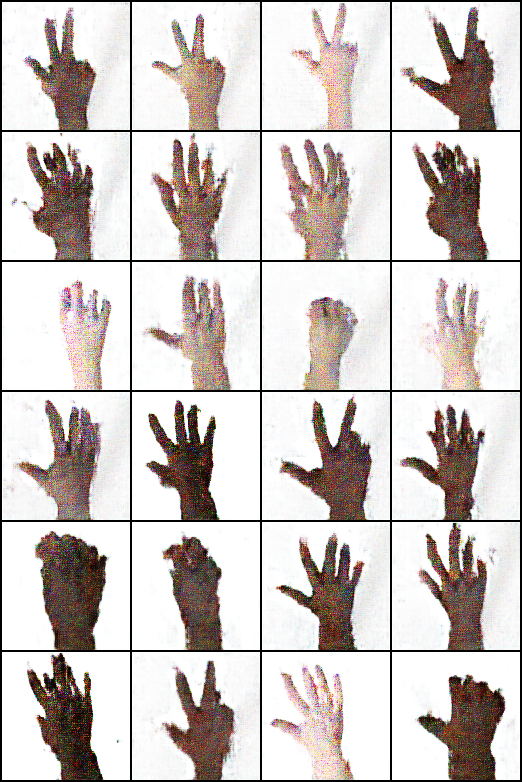

Saving model training check point
Epoch: [111/200]: D_loss: 0.127, G_loss: 4.185
Epoch: [112/200]: D_loss: 0.153, G_loss: 4.133
Epoch: [113/200]: D_loss: 0.167, G_loss: 4.167
Epoch: [114/200]: D_loss: 0.139, G_loss: 4.083
Epoch: [115/200]: D_loss: 0.260, G_loss: 4.133
Epoch: [116/200]: D_loss: 0.148, G_loss: 4.096
Epoch: [117/200]: D_loss: 0.132, G_loss: 4.305
Epoch: [118/200]: D_loss: 0.158, G_loss: 4.258
Epoch: [119/200]: D_loss: 0.159, G_loss: 4.344
Epoch: [120/200]: D_loss: 0.171, G_loss: 4.344
Saving sample output Sample_epoch_120.png


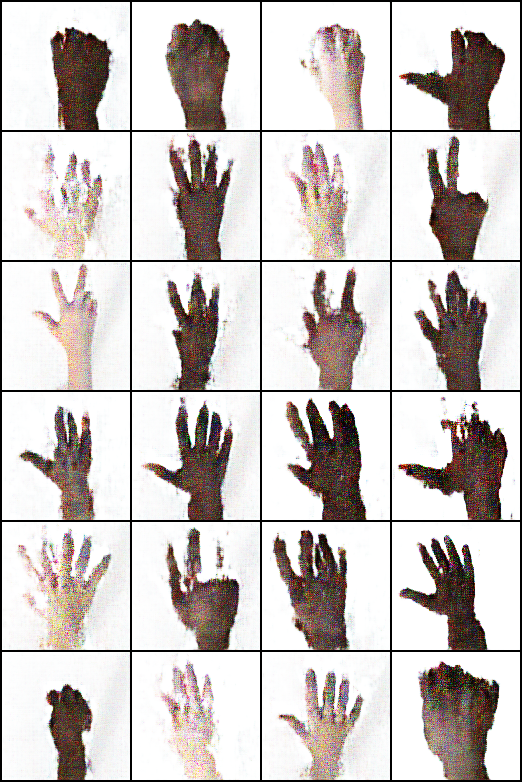

Saving model training check point
Epoch: [121/200]: D_loss: 0.166, G_loss: 4.271
Epoch: [122/200]: D_loss: 0.272, G_loss: 4.196
Epoch: [123/200]: D_loss: 0.149, G_loss: 4.280
Epoch: [124/200]: D_loss: 0.169, G_loss: 4.359
Epoch: [125/200]: D_loss: 0.230, G_loss: 4.446
Epoch: [126/200]: D_loss: 0.535, G_loss: 3.165
Epoch: [127/200]: D_loss: 0.144, G_loss: 3.956
Epoch: [128/200]: D_loss: 0.126, G_loss: 4.175
Epoch: [129/200]: D_loss: 0.125, G_loss: 4.373
Epoch: [130/200]: D_loss: 0.132, G_loss: 4.435
Saving sample output Sample_epoch_130.png


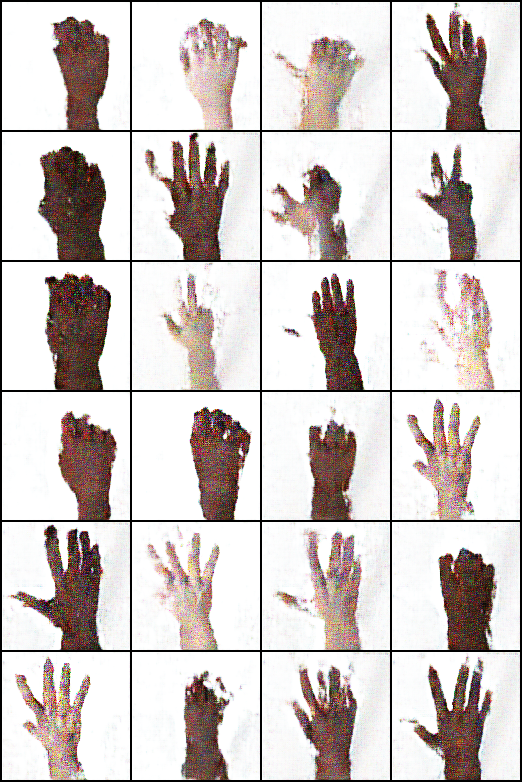

Saving model training check point
Epoch: [131/200]: D_loss: 0.111, G_loss: 4.297
Epoch: [132/200]: D_loss: 0.111, G_loss: 4.664
Epoch: [133/200]: D_loss: 0.121, G_loss: 4.511
Epoch: [134/200]: D_loss: 0.126, G_loss: 4.553
Epoch: [135/200]: D_loss: 0.214, G_loss: 4.487
Epoch: [136/200]: D_loss: 0.148, G_loss: 4.399
Epoch: [137/200]: D_loss: 0.194, G_loss: 4.382
Epoch: [138/200]: D_loss: 0.117, G_loss: 4.561
Epoch: [139/200]: D_loss: 0.384, G_loss: 4.357
Epoch: [140/200]: D_loss: 0.191, G_loss: 4.040
Saving sample output Sample_epoch_140.png


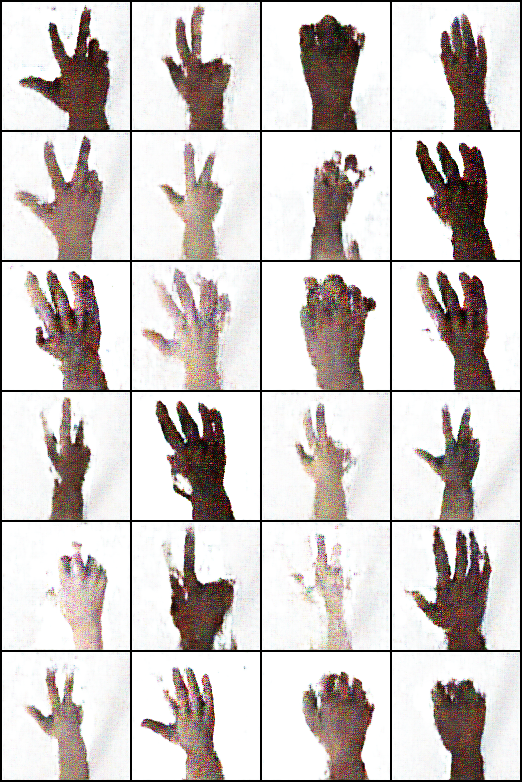

Saving model training check point
Epoch: [141/200]: D_loss: 0.121, G_loss: 4.404
Epoch: [142/200]: D_loss: 0.111, G_loss: 4.534
Epoch: [143/200]: D_loss: 0.127, G_loss: 4.554
Epoch: [144/200]: D_loss: 0.125, G_loss: 4.650
Epoch: [145/200]: D_loss: 0.138, G_loss: 4.601
Epoch: [146/200]: D_loss: 0.249, G_loss: 4.415
Epoch: [147/200]: D_loss: 0.186, G_loss: 4.491
Epoch: [148/200]: D_loss: 0.111, G_loss: 4.703
Epoch: [149/200]: D_loss: 0.133, G_loss: 4.813
Epoch: [150/200]: D_loss: 0.165, G_loss: 4.560
Saving sample output Sample_epoch_150.png


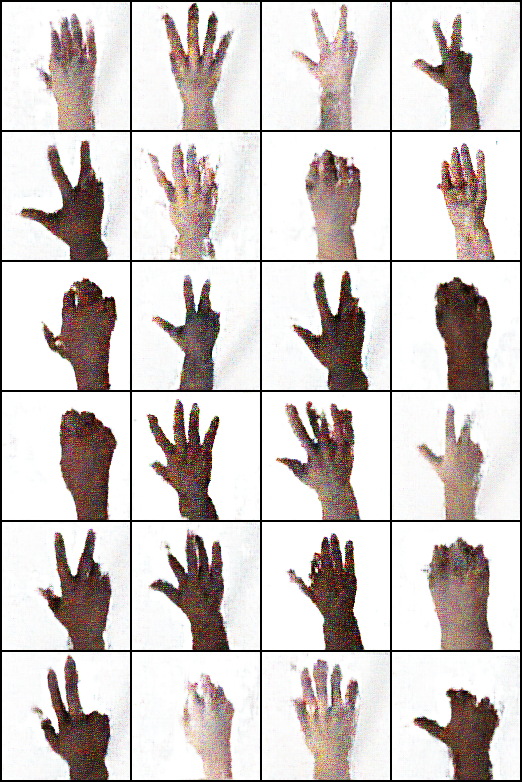

Saving model training check point
Epoch: [151/200]: D_loss: 0.366, G_loss: 4.297
Epoch: [152/200]: D_loss: 0.105, G_loss: 4.515
Epoch: [153/200]: D_loss: 0.164, G_loss: 4.489
Epoch: [154/200]: D_loss: 0.120, G_loss: 4.683
Epoch: [155/200]: D_loss: 0.093, G_loss: 4.792
Epoch: [156/200]: D_loss: 0.110, G_loss: 4.800
Epoch: [157/200]: D_loss: 0.098, G_loss: 4.907
Epoch: [158/200]: D_loss: 0.125, G_loss: 4.951
Epoch: [159/200]: D_loss: 0.145, G_loss: 4.857
Epoch: [160/200]: D_loss: 0.360, G_loss: 4.741
Saving sample output Sample_epoch_160.png


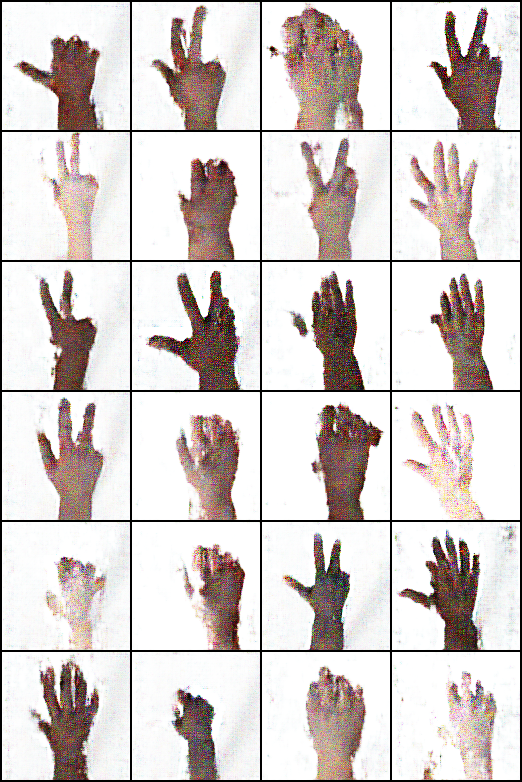

Saving model training check point
Epoch: [161/200]: D_loss: 0.324, G_loss: 3.811
Epoch: [162/200]: D_loss: 0.133, G_loss: 4.474
Epoch: [163/200]: D_loss: 0.192, G_loss: 4.551
Epoch: [164/200]: D_loss: 0.110, G_loss: 4.711
Epoch: [165/200]: D_loss: 0.122, G_loss: 4.824
Epoch: [166/200]: D_loss: 0.162, G_loss: 4.795
Epoch: [167/200]: D_loss: 0.120, G_loss: 4.818
Epoch: [168/200]: D_loss: 0.098, G_loss: 5.038
Epoch: [169/200]: D_loss: 0.194, G_loss: 4.708
Epoch: [170/200]: D_loss: 0.128, G_loss: 4.853
Saving sample output Sample_epoch_170.png


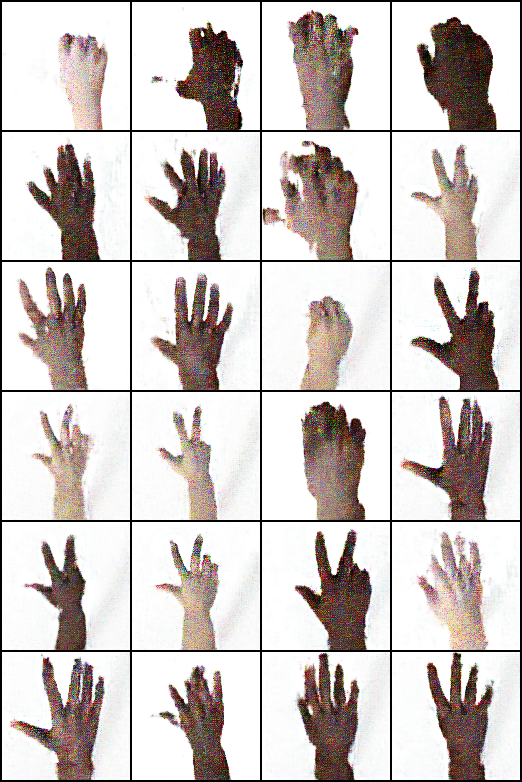

Saving model training check point
Epoch: [171/200]: D_loss: 0.125, G_loss: 4.933
Epoch: [172/200]: D_loss: 0.112, G_loss: 5.027
Epoch: [173/200]: D_loss: 0.237, G_loss: 4.948
Epoch: [174/200]: D_loss: 0.136, G_loss: 4.728
Epoch: [175/200]: D_loss: 0.096, G_loss: 5.022
Epoch: [176/200]: D_loss: 0.134, G_loss: 4.998
Epoch: [177/200]: D_loss: 0.100, G_loss: 5.009
Epoch: [178/200]: D_loss: 0.216, G_loss: 4.728
Epoch: [179/200]: D_loss: 0.117, G_loss: 5.085
Epoch: [180/200]: D_loss: 0.120, G_loss: 5.006
Saving sample output Sample_epoch_180.png


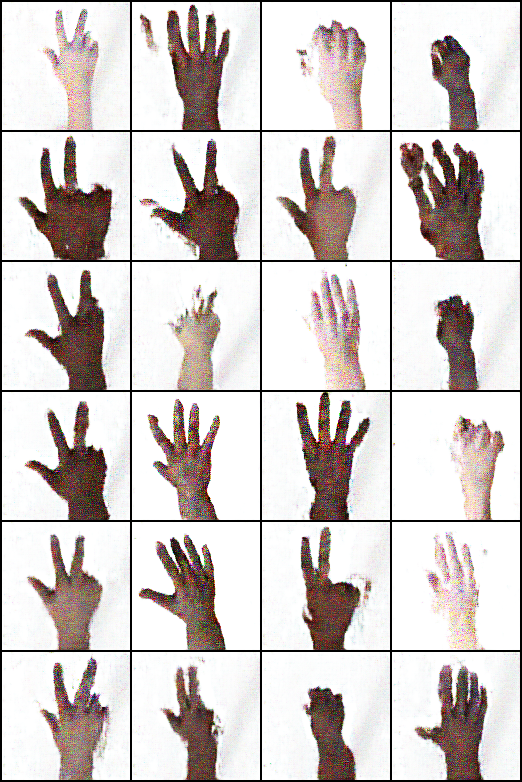

Saving model training check point
Epoch: [181/200]: D_loss: 0.113, G_loss: 5.128
Epoch: [182/200]: D_loss: 0.392, G_loss: 4.443
Epoch: [183/200]: D_loss: 0.158, G_loss: 4.578
Epoch: [184/200]: D_loss: 0.103, G_loss: 4.928
Epoch: [185/200]: D_loss: 0.140, G_loss: 5.028
Epoch: [186/200]: D_loss: 0.108, G_loss: 4.993
Epoch: [187/200]: D_loss: 0.085, G_loss: 5.185
Epoch: [188/200]: D_loss: 0.095, G_loss: 5.271
Epoch: [189/200]: D_loss: 0.150, G_loss: 5.304
Epoch: [190/200]: D_loss: 0.161, G_loss: 4.897
Saving sample output Sample_epoch_190.png


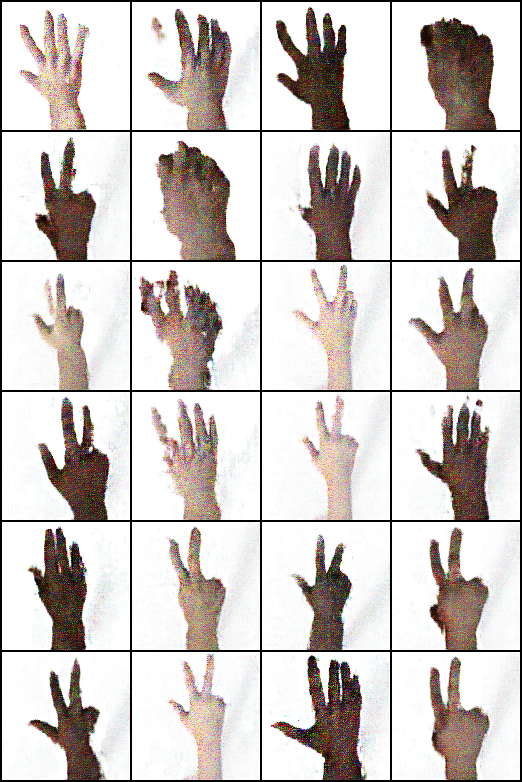

Saving model training check point
Epoch: [191/200]: D_loss: 0.110, G_loss: 5.039
Epoch: [192/200]: D_loss: 0.241, G_loss: 5.008
Epoch: [193/200]: D_loss: 0.141, G_loss: 4.859
Epoch: [194/200]: D_loss: 0.126, G_loss: 5.136
Epoch: [195/200]: D_loss: 0.170, G_loss: 5.151
Epoch: [196/200]: D_loss: 0.140, G_loss: 5.111
Epoch: [197/200]: D_loss: 0.178, G_loss: 5.049
Epoch: [198/200]: D_loss: 0.134, G_loss: 4.835
Epoch: [199/200]: D_loss: 0.127, G_loss: 5.077
Epoch: [200/200]: D_loss: 0.094, G_loss: 5.096
Saving sample output Sample_epoch_200.png


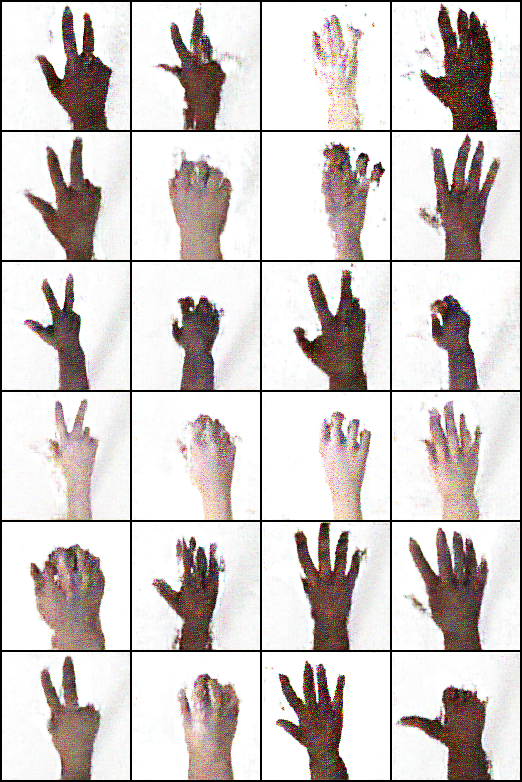

Saving model training check point


In [15]:
num_epochs = 200
start_epoch = 1
checkpoint_file = 'checkpoint.pt'

if os.path.isfile(checkpoint_file):
    print("checkpoint.pt exist.. loading last checkpoint")
    checkpoint = torch.load(checkpoint_file)
    generator.load_state_dict(checkpoint['g_state_dict'])
    discriminator.load_state_dict(checkpoint['d_state_dict'])
    G_optimizer.load_state_dict(checkpoint['g_optimizer'])
    D_optimizer.load_state_dict(checkpoint['d_optimizer'])
    start_epoch = checkpoint['epoch']

D_loss_plot, G_loss_plot = [], []
for epoch in range(start_epoch, num_epochs+1): 

    D_loss_list, G_loss_list = [], []
   
    for index, (real_images, labels) in enumerate(train_loader):
        D_optimizer.zero_grad()
        real_images = real_images.to(device)
        labels = labels.to(device)
        labels = labels.unsqueeze(1).long()

        real_target = Variable(torch.ones(real_images.size(0), 1).to(device))
        fake_target = Variable(torch.zeros(real_images.size(0), 1).to(device))
      
        D_real_loss = discriminator_loss(discriminator((real_images, labels)), real_target)
        # print(discriminator(real_images))
        noise_vector = torch.randn(real_images.size(0), latent_dim, device=device)  
        noise_vector = noise_vector.to(device)
               
        generated_image = generator((noise_vector, labels))
        output = discriminator((generated_image.detach(), labels))
        D_fake_loss = discriminator_loss(output,  fake_target)

        D_total_loss = (D_real_loss + D_fake_loss) / 2
        D_loss_list.append(D_total_loss)
      
        D_total_loss.backward()
        D_optimizer.step()

        # Train generator with real labels
        G_optimizer.zero_grad()
        G_loss = generator_loss(discriminator((generated_image, labels)), real_target)
        G_loss_list.append(G_loss)

        G_loss.backward()
        G_optimizer.step()

    print('Epoch: [%d/%d]: D_loss: %.3f, G_loss: %.3f' % (
            (epoch), num_epochs, torch.mean(torch.FloatTensor(D_loss_list)),\
             torch.mean(torch.FloatTensor(G_loss_list))))
    
    D_loss_plot.append(torch.mean(torch.FloatTensor(D_loss_list)))
    G_loss_plot.append(torch.mean(torch.FloatTensor(G_loss_list)))

    #saving outputs every Nth time
    if (epoch) % 10 == 0:
        checkpoint = {
            'epoch': epoch,
            'd_state_dict': discriminator.state_dict(),
            'g_state_dict': generator.state_dict(),
            'g_optimizer': G_optimizer.state_dict(),
            'd_optimizer': D_optimizer.state_dict()
        }
                
        filename = 'Sample_epoch_%d'% epoch + '.png'
        print("Saving sample output {}".format(filename))
        save_image(generated_image.data[:50], filename, nrow=4, normalize=True)
        display(Image.open(filename))
        
        torch.save(generator.state_dict(), 'generator_epoch_%d.pth' % (epoch))
        torch.save(discriminator.state_dict(), 'discriminator_epoch_%d.pth' % (epoch))

        print ("Saving model training check point")
        torch.save(checkpoint, checkpoint_file)

In [16]:
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

In [17]:
from numpy.random import randn

generator = Generator().to(device)
generator.load_state_dict(torch.load('generator_epoch_200.pth'), strict=False)
generator.eval()

Generator(
  (label_conditioned_generator): Sequential(
    (0): Embedding(3, 100)
    (1): Linear(in_features=100, out_features=16, bias=True)
  )
  (latent): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (model): Sequential(
    (0): ConvTranspose2d(513, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_si

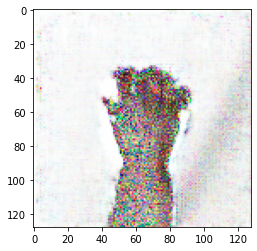

In [18]:
label = 1
labels = torch.ones(1) * label
labels = labels.to(device)
labels = labels.unsqueeze(1).long()

noise_vector = torch.randn(1, latent_dim, device=device)  
noise_vector = noise_vector.to(device)
generated_image = generator((noise_vector, labels))
generated_image = generated_image.permute(0,2,3,1)
generated_image = generated_image.detach().cpu() * 255
generated_image = np.array(generated_image) 
plt.imshow(generated_image[0].astype(np.uint8))